# What this notebook does:

1. Loads raw data

2. Basic Data Exploration

3. Converts data into a form that resembles the input the model will get in the real world

# 1. Setup and Imports

In [2]:
import re

import dill
import joblib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from pandas_profiling import ProfileReport
from sklearn.model_selection import train_test_split

%matplotlib inline
sns.set()


# 2. Loading Data

In [3]:
def load_raw_data():
    """Loads and returns raw mental health data from csv file

    Returns:
        pd.DataFrame: Loaded raw car data
    """
    return pd.read_csv('../Data/data_raw.csv')

In [4]:
raw_data = load_raw_data()
raw_data.head()

,I am currently employed at least part-time,I identify as having a mental illness,Education,I have my own computer separate from a smart phone,I have been hospitalized before for my mental illness,How many days were you hospitalized for your mental illness,I am legally disabled,I have my regular access to the internet,I live with my parents,I have a gap in my resume,...,Obsessive thinking,Mood swings,Panic attacks,Compulsive behavior,Tiredness,Age,Gender,Household Income,Region,Device Type
0,0,0,High School or GED,0,0,0.0,0,1,0,1,...,1.0,0.0,1.0,0.0,0.0,30-44,Male,"$25,000-$49,999",Mountain,Android Phone / Tablet
1,1,1,Some Phd,1,0,0.0,0,1,0,0,...,0.0,0.0,1.0,0.0,1.0,18-29,Male,"$50,000-$74,999",East South Central,MacOS Desktop / Laptop
2,1,0,Completed Undergraduate,1,0,0.0,0,1,0,0,...,0.0,0.0,0.0,0.0,0.0,30-44,Male,"$150,000-$174,999",Pacific,MacOS Desktop / Laptop
3,0,0,Some Undergraduate,1,0,NaN,0,1,1,1,...,0.0,0.0,0.0,0.0,0.0,30-44,Male,"$25,000-$49,999",New England,Windows Desktop / Laptop
4,1,1,Completed Undergraduate,1,1,35.0,1,1,0,1,...,1.0,1.0,1.0,1.0,1.0,30-44,Male,"$25,000-$49,999",East North Central,iOS Phone / Tablet


# 3. Basic Data Exploration

In [5]:
# Getting basic stats on numeric columns:
raw_data.describe()

,I am currently employed at least part-time,I identify as having a mental illness,I have my own computer separate from a smart phone,I have been hospitalized before for my mental illness,How many days were you hospitalized for your mental illness,I am legally disabled,I have my regular access to the internet,I live with my parents,I have a gap in my resume,Total length of any gaps in my resume in months.,...,I am on section 8 housing,How many times were you hospitalized for your mental illness,Lack of concentration,Anxiety,Depression,Obsessive thinking,Mood swings,Panic attacks,Compulsive behavior,Tiredness
count,334.000000,334.000000,334.000000,334.000000,297.000000,334.000000,334.000000,334.000000,334.000000,334.000000,...,334.000000,334.000000,333.000000,334.000000,334.000000,333.000000,333.000000,333.000000,333.000000,333.000000
mean,0.679641,0.239521,0.874251,0.077844,3.276094,0.098802,0.964072,0.110778,0.245509,8.497006,...,0.020958,1.194611,0.153153,0.299401,0.257485,0.126126,0.114114,0.147147,0.087087,0.300300
std,0.467315,0.427431,0.332063,0.268328,14.126045,0.298844,0.186390,0.314328,0.431034,20.722643,...,0.143459,8.115227,0.360677,0.458683,0.437905,0.332491,0.318428,0.354786,0.282387,0.459078
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,4.750000,...,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,100.000000,1.000000,1.000000,1.000000,1.000000,100.000000,...,1.000000,100.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [6]:
# Getting info on data types and null values:
raw_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 334 entries, 0 to 333
Data columns (total 31 columns):
 #   Column                                                        Non-Null Count  Dtype  
---  ------                                                        --------------  -----  
 0   I am currently employed at least part-time                    334 non-null    int64  
 1   I identify as having a mental illness                         334 non-null    int64  
 2   Education                                                     334 non-null    object 
 3   I have my own computer separate from a smart phone            334 non-null    int64  
 4   I have been hospitalized before for my mental illness         334 non-null    int64  
 5   How many days were you hospitalized for your mental illness   297 non-null    float64
 6   I am legally disabled                                         334 non-null    int64  
 7   I have my regular access to the internet                      334 non-n

In [7]:
# Getting null values in each column:
raw_data.isnull().sum()

I am currently employed at least part-time                       0
I identify as having a mental illness                            0
Education                                                        0
I have my own computer separate from a smart phone               0
I have been hospitalized before for my mental illness            0
How many days were you hospitalized for your mental illness     37
I am legally disabled                                            0
I have my regular access to the internet                         0
I live with my parents                                           0
I have a gap in my resume                                        0
Total length of any gaps in my resume in months.                 0
Annual income (including any social welfare programs) in USD     0
I am unemployed                                                  0
I read outside of work and school                                0
Annual income from social welfare programs                    

In [8]:
raw_data.shape

(334, 31)

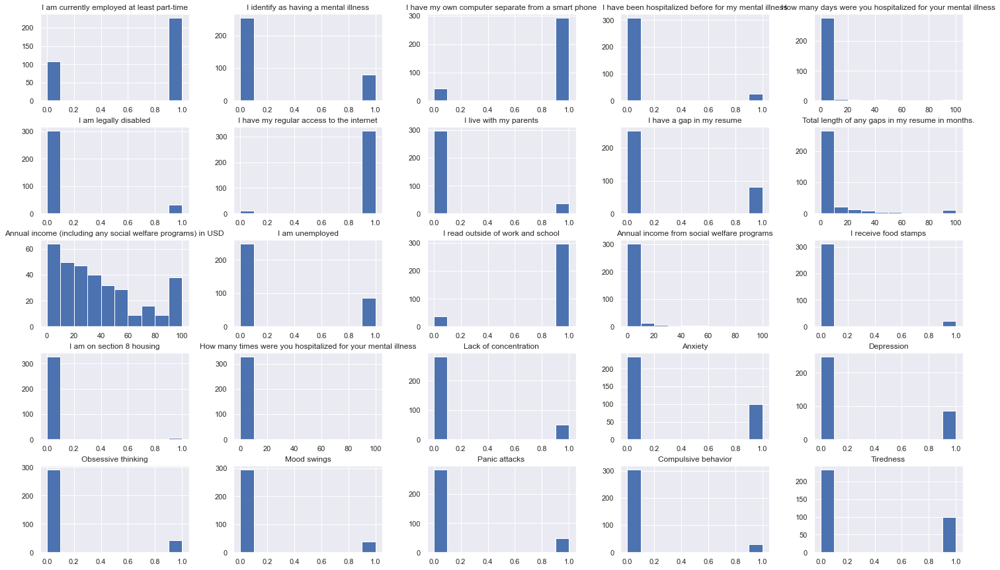

In [16]:
raw_data.hist(figsize=(25, 15))
plt.show()

In [17]:
profile = ProfileReport(raw_data, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:04<00:00,  4.69s/it]


In [18]:
profile.to_file("../Reports/report_raw.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 30.31it/s]


# Processing

Now that we have some information and visualizations to work with lets look at the things we might want to change. We need to remember to not change the data too much. It should resemble the input we will get from the real world, this is not intended to be feature engineering:

1. Handle Missing Values (We will not encounter missing values in the real world for this particular use case)
2. Remove Outliers (which are clear mistakes)
3. Handle Numeric columns disguised as strings

# Handle Missing Values

In [9]:
# Get number of columns with missing values:
num_null_columns = len(raw_data)-len(raw_data.dropna())
print("Number of rowa with missing values:", num_null_columns)

# Get % of total rows:
percent_of_rows = round((num_null_columns/len(raw_data))*100, 2)
print(f"Percentage of all rows: {percent_of_rows}%")

Number of rowa with missing values: 40
Percentage of all rows: 11.98%


We can see that the number of rows with null values is not very much. So we can remove all the rows with null values.

**Note:** If you have a dataframe with a large number of null values, you should probably use an Imputer in the next section.

In [10]:
# Dropping rows with null values:
nonull_data = raw_data.dropna()

# Checking shapes of data with and without null values:
print(raw_data.shape)
print(nonull_data.shape)

(334, 31)
(294, 31)


## Remove Outliers

**Important:** The outliers in our case are not incorrect measurements, and chances are that we might see these values in the real world. So we should not remove them from the train set on which we will train our model. We eill remove these only for the purposes of visualization.

Always check the min, max and mean of all the columns (from the pandas-profiling report) and only remove the outliers of they are incorrect and you are confident that you wont see similiar ones in the real world.

But if you encounter a dataset with a lot of "bad" outliers you can use the below function to remove them:

In [11]:
# Values which are over 3 standard deviations from the mean are considered outliers. 
# You can change this by editing z_thresh.

def remove_outliers(df, z_thresh=3):
    """Remove all outliers in df and return clean df"""
    for column in df.select_dtypes(np.number).columns:
        data_mean, data_std = df[column].mean(), df[column].std()
        cut_off = data_std * z_thresh
        lower, upper = data_mean - cut_off, data_mean + cut_off
        # Drop all rows where column value is below lower and above upper
        df = df[(df[column] > lower) & (df[column] < upper)]
    return df

# Saving updated data

In [12]:
# Save the data:
nonull_data.to_csv("../Data/cleaned_data.csv", index=False)

# Create Final Report

Its a good idea to create and save another pandas profiling report. So we can compare the outcomes of this notebook with the raw data:

In [12]:
profile = ProfileReport(nonull_data, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:05<00:00,  5.14s/it]


In [13]:
profile.to_file("../Reports/report_clean.html")

Export report to file: 100%|██████████| 1/1 [00:00<00:00, 24.27it/s]


# Split into Train, Test and Val

Now we need to split the data into train, test and validation sets. We will use the `train_test_split` function from sklearn:

In [13]:
df_clean = pd.read_csv("../Data/cleaned_data.csv")

To use the stratify argument in train_test_split we need a categorical variable, which has no missing values. We mostly use the target variable for this. 

But in our case we have 4 target variables!. So, we will use the Age column since it has a nice gaussian distribution and is relevent in splitting the data properly

In [15]:
from sklearn.model_selection import train_test_split

# Assigning the features and labels to variables:
X = df_clean.drop(["Anxiety", "Depression", "Compulsive behavior"], axis=1)
y = df_clean[["Anxiety", "Depression", "Compulsive behavior"]]

# Setting the train, test and val ratios:
train_ratio = 0.8
validation_ratio = 0.2  # (20 percent of test data)

# Doing the actual split (dont forget the random_state and the stratify):
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=1-train_ratio, random_state=42, stratify=X["Age"])
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=1-validation_ratio, random_state=42, stratify=X_test["Age"])

# Lets check the shapes of each of the sets:
print("X_train shape:",X_train.shape)
print("X_val shape:",X_val.shape)
print("X_test shape:",X_test.shape)


X_train shape: (235, 28)
X_val shape: (11, 28)
X_test shape: (48, 28)


In [16]:
trainset = pd.concat([X_train, y_train], axis=1)
valset = pd.concat([X_val, y_val], axis=1)
testset = pd.concat([X_test, y_test], axis=1)

trainset.to_csv("../Data/trainset.csv", index=False)
valset.to_csv("../Data/valset.csv", index=False)
testset.to_csv("../Data/testset.csv", index=False)

# Done!